In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pylab import *
%matplotlib inline

In [46]:
def plot_imagens_2(img1, tit1, img2, tit2, res):
    figure(figsize = res)
    plt.subplot(1,2,1), plt.imshow(img1), plt.title(tit1)
    plt.xticks([]),plt.yticks([])
    plt.subplot(1,2,2), plt.imshow(img2), plt.title(tit2)
    plt.xticks([]),plt.yticks([])
    plt.show()
    

In [4]:
def plot_imagens_3(img1, tit1, img2, tit2, img3, tit3, res):
    figure(figsize = res)
    plt.subplot(1,3,1), plt.imshow(img1), plt.title(tit1)
    plt.xticks([]),plt.yticks([])
    plt.subplot(1,3,2), plt.imshow(img2), plt.title(tit2)
    plt.xticks([]),plt.yticks([])
    plt.subplot(1,3,3), plt.imshow(img3), plt.title(tit3)
    plt.xticks([]),plt.yticks([])
    plt.show()

In [5]:
path = "E:/IAM/imagens_am/"

In [6]:
im_f= cv2.imread(path+ 'familia_semluz.tif')

In [8]:
im_f.shape

(768, 1024, 3)

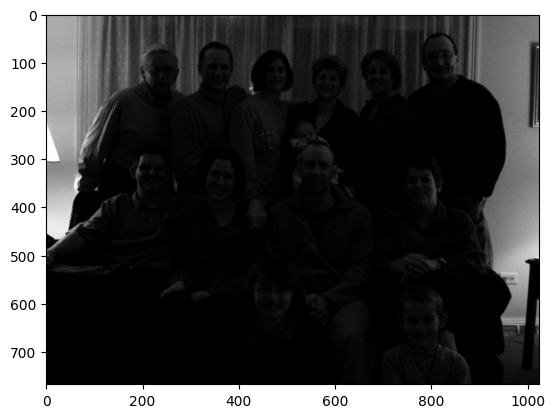

In [9]:
imshow(im_f)

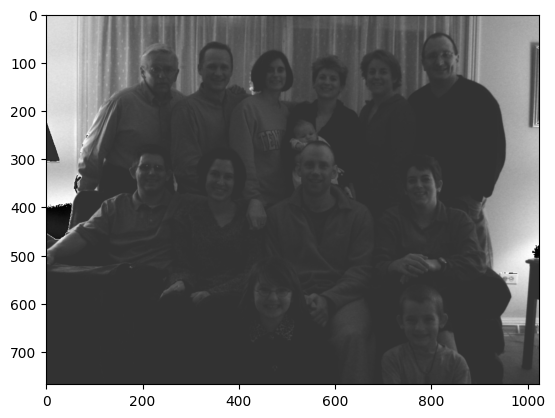

In [10]:
imshow(im_f+50)

## pré-processamento de imagem para melhor modelo

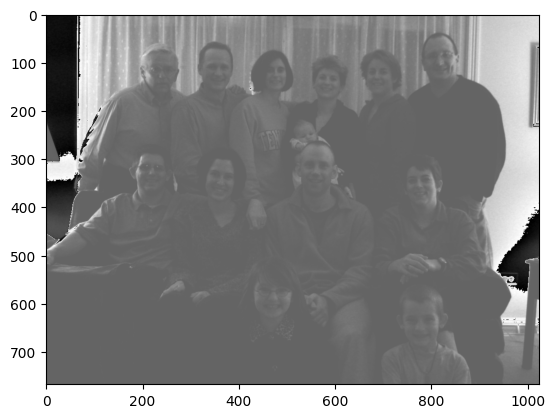

In [11]:
imshow(im_f + 100)

In [18]:
im_fusca= cv2.imread(path+ 'fusca_placa.jpg')

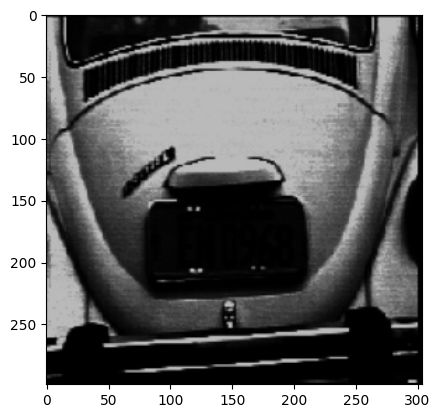

In [19]:
imshow(im_fusca)

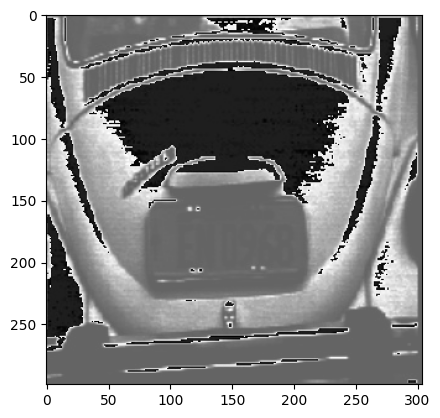

In [20]:
imshow(im_fusca + 100)

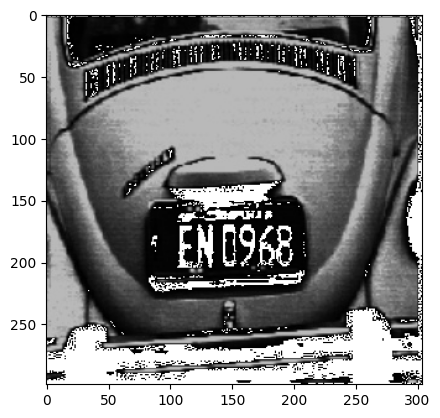

In [21]:
imshow(im_fusca + 255)

In [28]:
im_a = cv2.imread(path + 'arara_azul2.jpg')

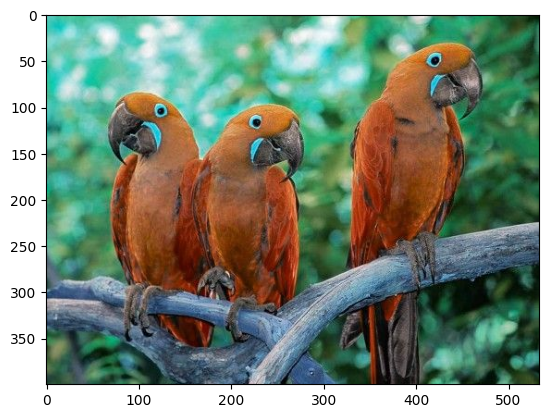

In [29]:
imshow(im_a)

In [35]:
im_rgb = cv2.cvtColor(im_a, cv2.COLOR_BGR2RGB)

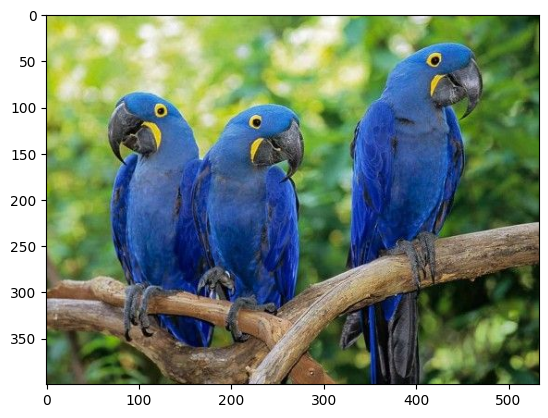

In [42]:
imshow(im_rgb)

In [41]:
k1 = np.ones((5,5), np.float32)/25

In [50]:
k1

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

In [49]:
img_filtro2d = cv2.filter2D(im_rgb, -1, k1)

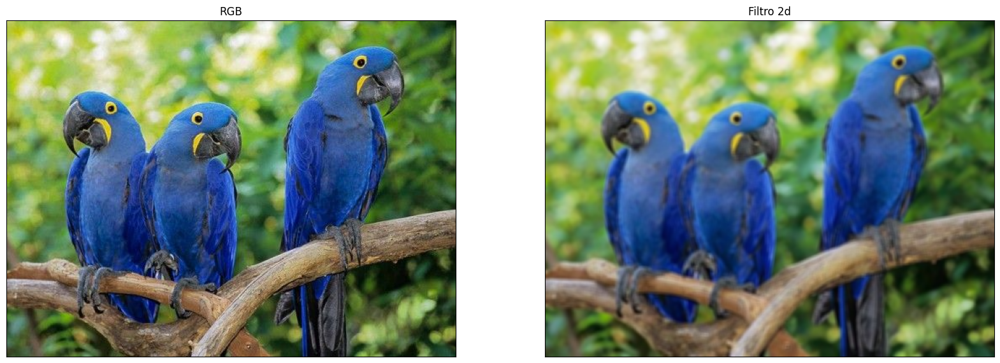

In [48]:
plot_imagens_2(im_rgb, 'RGB', img_filtro2d, 'Filtro 2d', (20,20))

In [52]:
k2 = np.array([[-1,-1,-1],
               [-1,9,-1],
               [-1,-1,-1]])

In [53]:
im_filtro2d_k2 = cv2.filter2D(im_rgb, -1, k2)

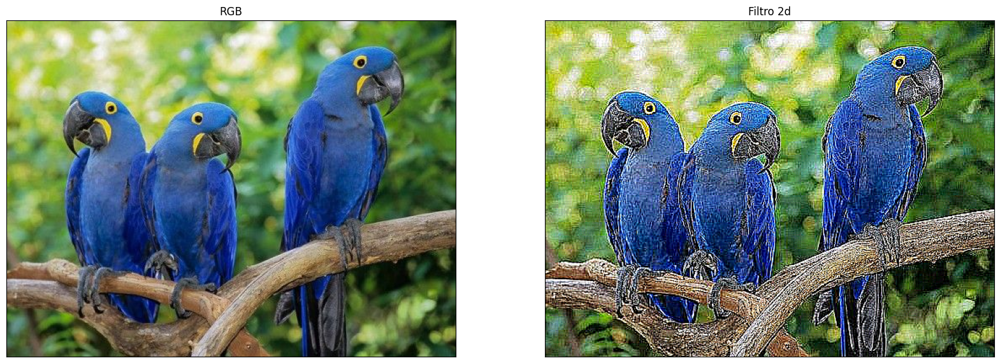

In [54]:
plot_imagens_2(im_rgb, 'RGB', im_filtro2d_k2, 'Filtro 2d', (20,20))

In [63]:
k3 = np.array([[0,-1,0],
               [-1,5,-1],
               [0,-1,0]])

In [64]:
im_filtro2d_k3 = cv2.filter2D(im_rgb, -1, k3)

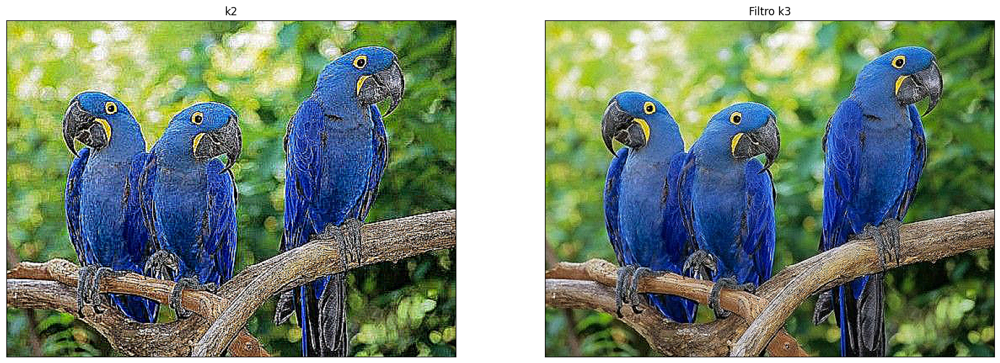

In [66]:
plot_imagens_2(im_filtro2d_k2, 'k2', im_filtro2d_k3, 'Filtro k3', (20,20))

In [67]:
k_inversao = np.array([[1,0,0],
               [0,0,0],
               [0,0,-1]])

In [68]:
im_filtro2d_inversao = cv2.filter2D(im_rgb, -1, k_inversao)

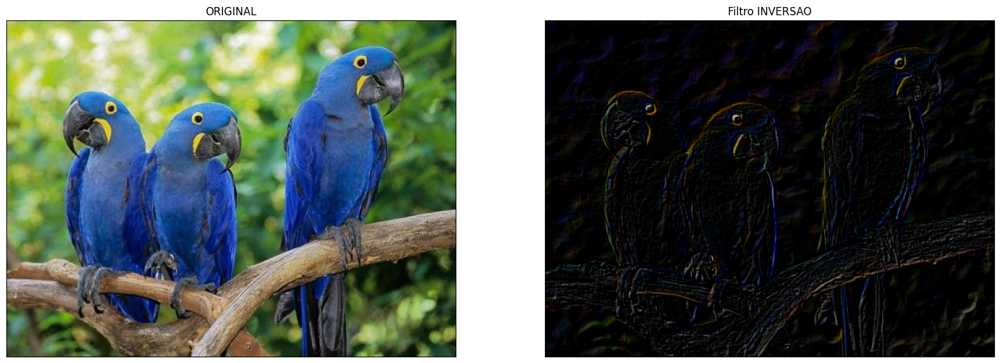

In [71]:
plot_imagens_2(im_rgb, 'ORIGINAL', im_filtro2d_inversao, 'Filtro INVERSAO', (20,20))

In [74]:
im_tigre = cv2.imread(path + 'tigre_saltpepper.png')

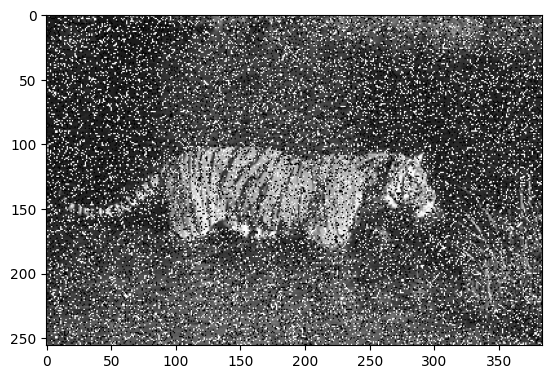

In [78]:
imshow(im_tigre)

In [96]:
img_media = cv2.medianBlur(im_tigre,7)

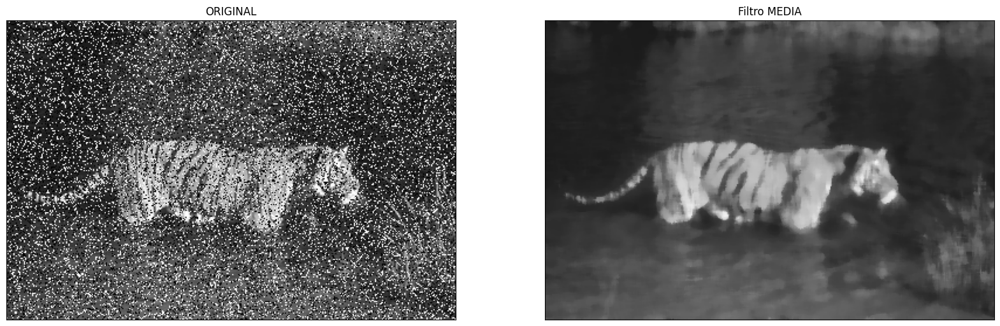

In [97]:
plot_imagens_2(im_tigre, 'ORIGINAL', img_media, 'Filtro MEDIA', (20,20))

In [98]:
im_ruido = im_tigre - img_media

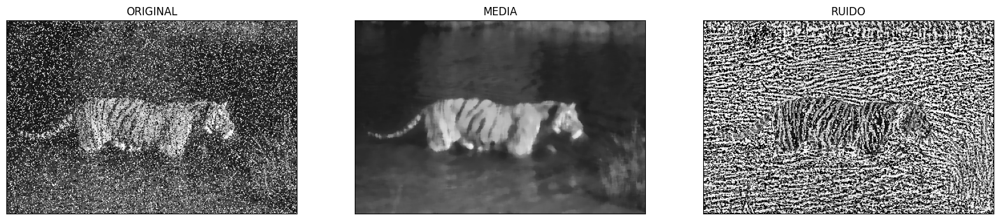

In [99]:
plot_imagens_3(im_tigre, 'ORIGINAL', img_media, 'MEDIA',im_ruido, 'RUIDO', (20,20))

In [100]:
im_antenas = cv2.imread(path + 'atenas_saltpepper.png')

In [115]:
img_media_antenas = cv2.medianBlur(im_antenas,5)

In [116]:
im_ruido_antenas = im_antenas - img_media_antenas

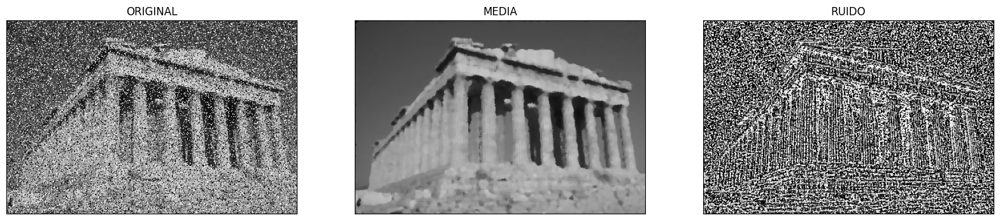

In [117]:
plot_imagens_3(im_antenas, 'ORIGINAL', img_media_antenas, 'MEDIA',im_ruido_antenas, 'RUIDO', (20,20))

## Médodo Sabel CANNY

In [121]:
im_xadrez = cv2.imread(path + 'xadrez.jpg', cv2.IMREAD_GRAYSCALE )

In [122]:
im_xadrez.shape

(450, 800)

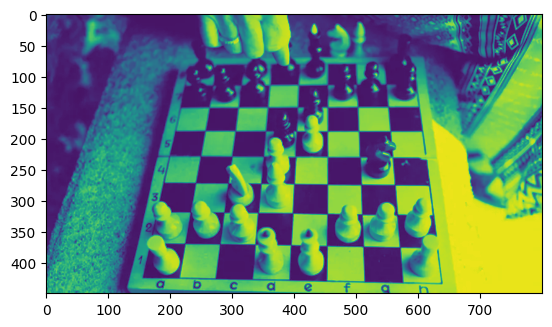

In [123]:
imshow(im_xadrez)

In [132]:
im_sob_x = cv2.Sobel(im_xadrez, cv2.CV_64F,1,0, 5)

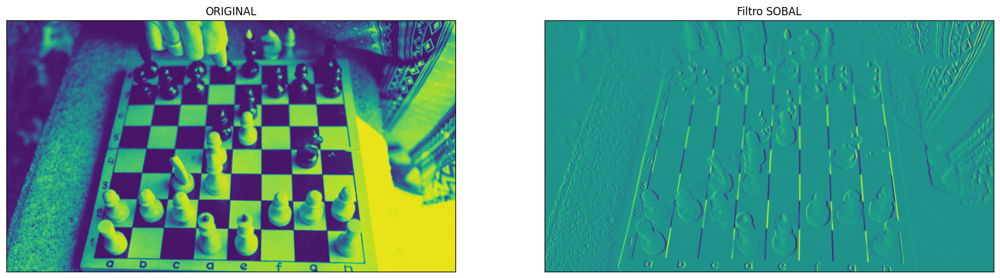

In [133]:
plot_imagens_2(im_xadrez, 'ORIGINAL', im_sob_x, 'Filtro SOBAL', (20,20))

In [135]:
im_sob_y = cv2.Sobel(im_xadrez, cv2.CV_64F,0,1, 5)

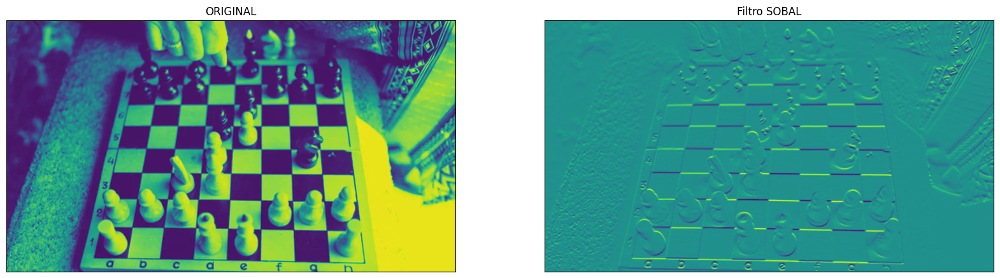

In [136]:
plot_imagens_2(im_xadrez, 'ORIGINAL', im_sob_y, 'Filtro SOBAL', (20,20))

In [137]:
im_canny = cv2.Canny(im_xadrez, 100, 200)

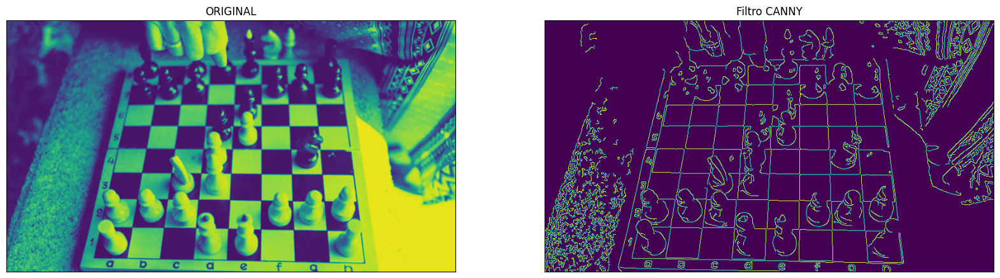

In [138]:
plot_imagens_2(im_xadrez, 'ORIGINAL', im_canny, 'Filtro CANNY', (20,20))

### Regressão Linear

In [142]:
!pip install scikit-learn seaborn

  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/1b/7c/66d34dc231a309cc3a7f3eeb848319be3b616fd2918db302aaef727eff4a/scikit_learn-1.3.1-cp39-cp39-win_amd64.whl.metadata
  Obtaining dependency information for seaborn from https://files.pythonhosted.org/packages/7b/e5/83fcd7e9db036c179e0352bfcd20f81d728197a16f883e7b90307a88e65e/seaborn-0.13.0-py3-none-any.whl.metadata
  Obtaining dependency information for joblib>=1.1.1 from https://files.pythonhosted.org/packages/10/40/d551139c85db202f1f384ba8bcf96aca2f329440a844f924c8a0040b6d02/joblib-1.3.2-py3-none-any.whl.metadata
  Obtaining dependency information for threadpoolctl>=2.0.0 from https://files.pythonhosted.org/packages/81/12/fd4dea011af9d69e1cad05c75f3f7202cdcbeac9b712eea58ca779a72865/threadpoolctl-3.2.0-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/9.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.3 MB 660.6 kB/s eta 0:00:15
   ------------

In [146]:
import  pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import linear_model
import seaborn as sns

In [150]:
path_f = 'E:/IAM/datasets/'

In [151]:
df_co2 = pd.read_csv(path_f + 'ConsumoxCo2.csv')

In [152]:
df_co2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1067 entries, 0 to 1066
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   MODELYEAR                 1067 non-null   int64  
 1   MAKE                      1067 non-null   object 
 2   MODEL                     1067 non-null   object 
 3   VEHICLECLASS              1067 non-null   object 
 4   ENGINESIZE                1067 non-null   float64
 5   CYLINDERS                 1067 non-null   int64  
 6   TRANSMISSION              1067 non-null   object 
 7   FUELTYPE                  1067 non-null   object 
 8   FUELCONSUMPTION_CITY      1067 non-null   float64
 9   FUELCONSUMPTION_HWY       1067 non-null   float64
 10  FUELCONSUMPTION_COMB      1067 non-null   float64
 11  FUELCONSUMPTION_COMB_MPG  1067 non-null   int64  
 12  CO2EMISSIONS              1067 non-null   int64  
dtypes: float64(4), int64(4), object(5)
memory usage: 108.5+ KB


In [155]:
df_co2.head()

,MODELYEAR,MAKE,MODEL,VEHICLECLASS,ENGINESIZE,CYLINDERS,TRANSMISSION,FUELTYPE,FUELCONSUMPTION_CITY,FUELCONSUMPTION_HWY,FUELCONSUMPTION_COMB,FUELCONSUMPTION_COMB_MPG,CO2EMISSIONS
0,2014,ACURA,ILX,COMPACT,2.0,4,AS5,Z,9.9,6.7,8.5,33,196
1,2014,ACURA,ILX,COMPACT,2.4,4,M6,Z,11.2,7.7,9.6,29,221
2,2014,ACURA,ILX HYBRID,COMPACT,1.5,4,AV7,Z,6.0,5.8,5.9,48,136
3,2014,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS6,Z,12.7,9.1,11.1,25,255
4,2014,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS6,Z,12.1,8.7,10.6,27,244


In [153]:
df_co2.describe()

,MODELYEAR,ENGINESIZE,CYLINDERS,FUELCONSUMPTION_CITY,FUELCONSUMPTION_HWY,FUELCONSUMPTION_COMB,FUELCONSUMPTION_COMB_MPG,CO2EMISSIONS
count,1067.0,1067.000000,1067.000000,1067.000000,1067.000000,1067.000000,1067.000000,1067.000000
mean,2014.0,3.346298,5.794752,13.296532,9.474602,11.580881,26.441425,256.228679
std,0.0,1.415895,1.797447,4.101253,2.794510,3.485595,7.468702,63.372304
min,2014.0,1.000000,3.000000,4.600000,4.900000,4.700000,11.000000,108.000000
25%,2014.0,2.000000,4.000000,10.250000,7.500000,9.000000,21.000000,207.000000
50%,2014.0,3.400000,6.000000,12.600000,8.800000,10.900000,26.000000,251.000000
75%,2014.0,4.300000,8.000000,15.550000,10.850000,13.350000,31.000000,294.000000
max,2014.0,8.400000,12.000000,30.200000,20.500000,25.800000,60.000000,488.000000


In [154]:
df_co2.groupby('MAKE').count()

,MODELYEAR,MODEL,VEHICLECLASS,ENGINESIZE,CYLINDERS,TRANSMISSION,FUELTYPE,FUELCONSUMPTION_CITY,FUELCONSUMPTION_HWY,FUELCONSUMPTION_COMB,FUELCONSUMPTION_COMB_MPG,CO2EMISSIONS
MAKE,,,,,,,,,,,,
ACURA,12,12,12,12,12,12,12,12,12,12,12,12
ASTON MARTIN,7,7,7,7,7,7,7,7,7,7,7,7
AUDI,49,49,49,49,49,49,49,49,49,49,49,49
BENTLEY,8,8,8,8,8,8,8,8,8,8,8,8
BMW,64,64,64,64,64,64,64,64,64,64,64,64
BUICK,16,16,16,16,16,16,16,16,16,16,16,16
CADILLAC,32,32,32,32,32,32,32,32,32,32,32,32
CHEVROLET,86,86,86,86,86,86,86,86,86,86,86,86
CHRYSLER,19,19,19,19,19,19,19,19,19,19,19,19


In [158]:
selecao = df_co2[['ENGINESIZE','CO2EMISSIONS']]

In [159]:
selecao.head()

,ENGINESIZE,CO2EMISSIONS
0,2.0,196
1,2.4,221
2,1.5,136
3,3.5,255
4,3.5,244


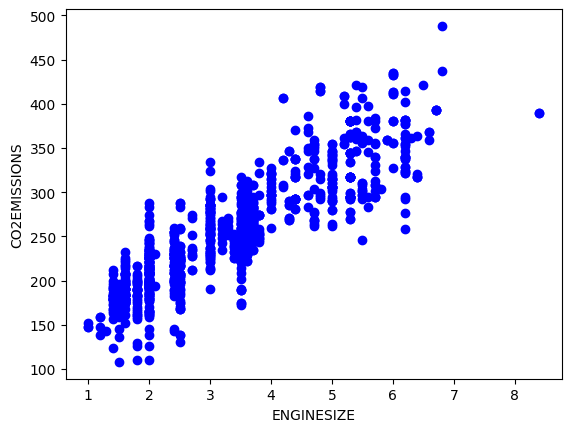

In [164]:
plt.scatter(selecao['ENGINESIZE'],selecao['CO2EMISSIONS'], color = 'blue')
plt.xlabel('ENGINESIZE')
plt.ylabel('CO2EMISSIONS')
plt.show()

In [173]:
selecao1 = df_co2[['VEHICLECLASS','CO2EMISSIONS']]

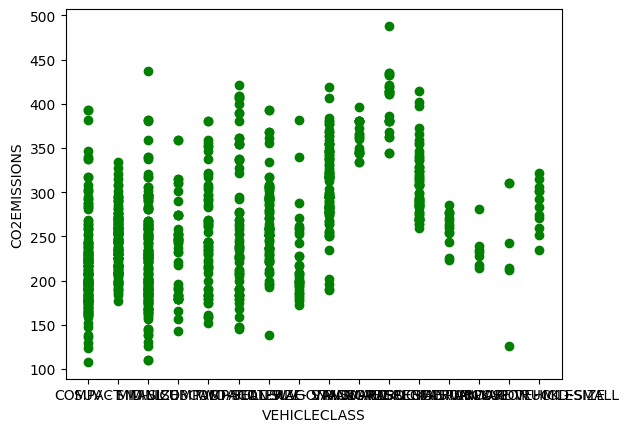

In [174]:
plt.scatter(selecao1['VEHICLECLASS'],selecao1['CO2EMISSIONS'], color = 'green')
plt.xlabel('VEHICLECLASS')
plt.ylabel('CO2EMISSIONS')
plt.show()

In [171]:
selecao2 = df_co2[['CYLINDERS','CO2EMISSIONS']]

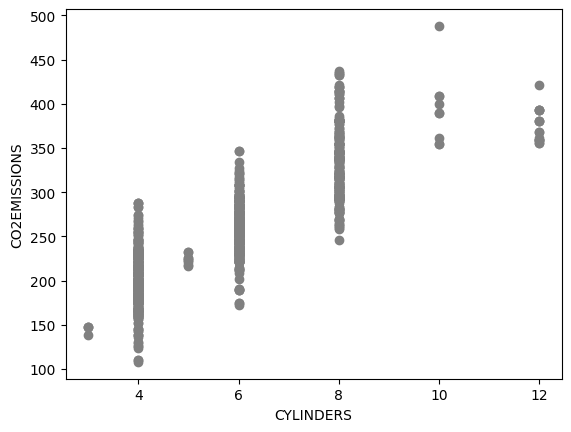

In [176]:
plt.scatter(selecao2['CYLINDERS'],selecao2['CO2EMISSIONS'], color = 'gray')
plt.xlabel('CYLINDERS')
plt.ylabel('CO2EMISSIONS')
plt.show()

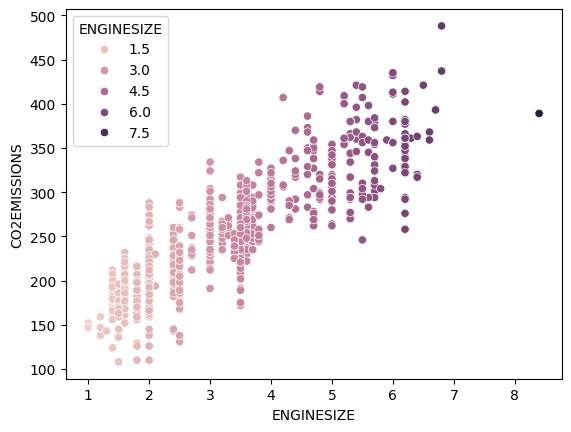

In [178]:
comp = sns.scatterplot(x='ENGINESIZE', y = 'CO2EMISSIONS', data = selecao,color = 'blue', hue = 'ENGINESIZE')

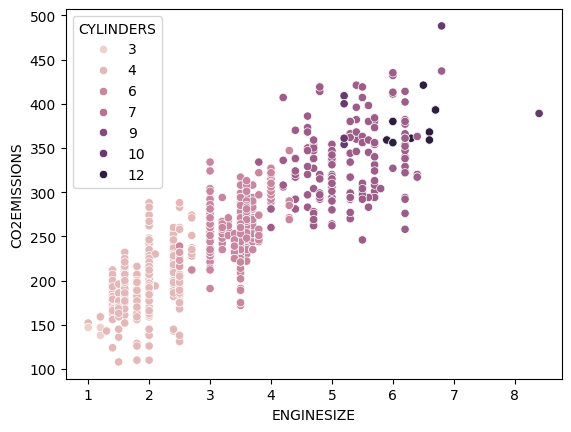

In [190]:
comp = sns.scatterplot(x='ENGINESIZE', y = 'CO2EMISSIONS', data = df_co2,color = 'blue', hue = 'CYLINDERS')

## Partição de data set
# 60 40 / 70 30 / 80 20

In [187]:
treino1 = selecao[:(int((len(selecao)*0.8)))]
teste1 = selecao[(int((len(selecao)*0.8))):]

In [188]:
selecao.shape

(1067, 2)

In [189]:
treino1.shape , teste1.shape

((853, 2), (214, 2))

In [193]:
treino2 = selecao[:(int((len(selecao)*0.7)))]
teste2 = selecao[(int((len(selecao)*0.7))):]

In [195]:
treino2.shape , teste2.shape

((746, 2), (321, 2))

In [196]:
modelo = linear_model.LinearRegression()


In [198]:
train_x = np.array(treino1[['ENGINESIZE']])
train_y =  np.array(treino1[['CO2EMISSIONS']])

In [200]:
modelo.fit(train_x, train_y)

LinearRegression()

In [201]:
modelo.coef_

array([[38.79512384]])

In [202]:
modelo.intercept_

array([127.16989951])

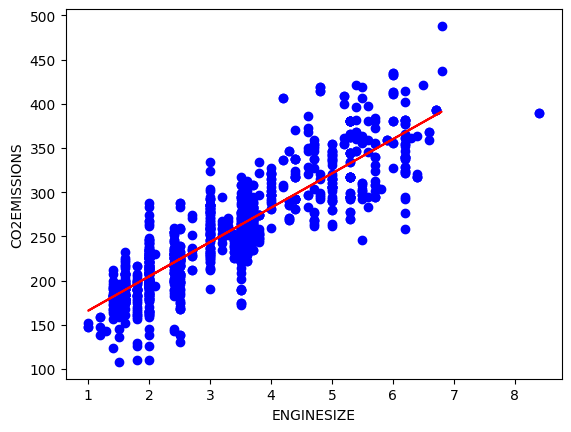

In [203]:
plt.scatter(selecao['ENGINESIZE'],selecao['CO2EMISSIONS'], color = 'blue')

plt.plot(train_x, modelo.coef_* train_x + modelo.intercept_, '-r')
plt.xlabel('ENGINESIZE')
plt.ylabel('CO2EMISSIONS')
plt.show()

In [206]:
def model_pred(dados_entrada, intercept, slope):
    pred = dados_entrada * slope + intercept
    return pred

In [209]:
eng_size = 2.0
emissao_estimada = model_pred(eng_size, modelo.intercept_[0], modelo.coef_[0][0])

In [210]:
print('Emissão para motor', eng_size, 'é', emissao_estimada)

Emissão para motor 2.0 é 204.7601471809324


In [212]:
test_x = np.array(teste1[['ENGINESIZE']])
test_y = np.array(teste1[['CO2EMISSIONS']])
test_y_ = modelo.predict(test_x)

In [214]:
print('MSE (MEAN SUM OS SQUARES) : %.2F' % np.mean((test_y_ - test_y)** 2))

MSE (MEAN SUM OS SQUARES) : 746.45


In [220]:
print('MAE (MEA (mEAN ABSOLUTE ERROR): %.2f' % np.mean(np.absolute(test_y_ - test_y)))

MAE (MEA (mEAN ABSOLUTE ERROR): 20.60


In [217]:
from sklearn.metrics import r2_score

In [218]:
print('Score R2: % .2f' % r2_score(test_y, test_y_))

Score R2:  0.79


## Com 75 e 25

In [226]:
treino3 = selecao[:(int((len(selecao)*0.75)))]
teste3 = selecao[(int((len(selecao)*0.75))):]

In [227]:
modelo3 = linear_model.LinearRegression()

In [228]:
train_x3 = np.array(treino3[['ENGINESIZE']])
train_y3 =  np.array(treino3[['CO2EMISSIONS']])

In [229]:
modelo3.fit(train_x3, train_y3)

LinearRegression()

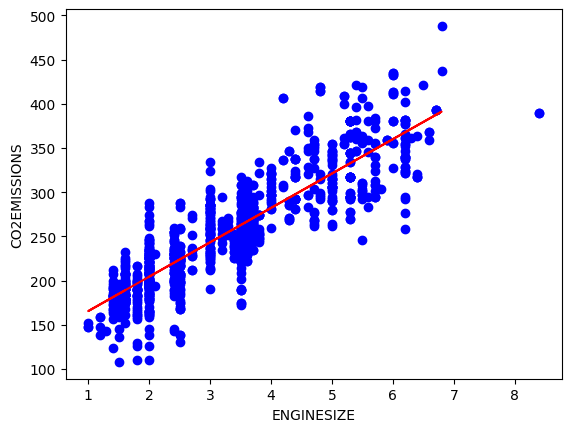

In [236]:
plt.scatter(selecao['ENGINESIZE'],selecao['CO2EMISSIONS'], color = 'blue')

plt.plot(train_x3, modelo3.coef_* train_x3 + modelo3.intercept_, '-r')
plt.xlabel('ENGINESIZE')
plt.ylabel('CO2EMISSIONS')
plt.show()

In [237]:
test_x3 = np.array(teste3[['ENGINESIZE']])
test_y3 = np.array(teste3[['CO2EMISSIONS']])
test_y3_ = modelo.predict(test_x3)

In [238]:
print('MSE (MEAN SUM OS SQUARES) : %.2F' % np.mean((test_y3_ - test_y3)** 2))

MSE (MEAN SUM OS SQUARES) : 731.78


In [239]:
print('MAE (MEA (mEAN ABSOLUTE ERROR): %.2f' % np.mean(np.absolute(test_y3_ - test_y3)))

MAE (MEA (mEAN ABSOLUTE ERROR): 19.96


In [240]:
from sklearn.metrics import r2_score

In [241]:
print('Score R2: % .2f' % r2_score(test_y3, test_y3_))

Score R2:  0.78


In [242]:
df_co2.head()

,MODELYEAR,MAKE,MODEL,VEHICLECLASS,ENGINESIZE,CYLINDERS,TRANSMISSION,FUELTYPE,FUELCONSUMPTION_CITY,FUELCONSUMPTION_HWY,FUELCONSUMPTION_COMB,FUELCONSUMPTION_COMB_MPG,CO2EMISSIONS
0,2014,ACURA,ILX,COMPACT,2.0,4,AS5,Z,9.9,6.7,8.5,33,196
1,2014,ACURA,ILX,COMPACT,2.4,4,M6,Z,11.2,7.7,9.6,29,221
2,2014,ACURA,ILX HYBRID,COMPACT,1.5,4,AV7,Z,6.0,5.8,5.9,48,136
3,2014,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS6,Z,12.7,9.1,11.1,25,255
4,2014,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS6,Z,12.1,8.7,10.6,27,244


In [398]:
X = df_co2[['ENGINESIZE','CYLINDERS','FUELCONSUMPTION_CITY','FUELCONSUMPTION_HWY','FUELCONSUMPTION_COMB','FUELCONSUMPTION_COMB_MPG']]

In [399]:
Y = df_co2['CO2EMISSIONS']

In [400]:
treino = df_co2[:(int((len(df_co2) * 0.75)))]
teste =df_co2[(int((len(df_co2) * 0.75))):]

In [401]:
treino.shape, teste.shape

((800, 13), (267, 13))

In [402]:
train_x = np.array(treino[['ENGINESIZE','CYLINDERS','FUELCONSUMPTION_CITY','FUELCONSUMPTION_HWY','FUELCONSUMPTION_COMB','FUELCONSUMPTION_COMB_MPG']])

In [403]:
train_y = np.array(treino['CO2EMISSIONS'])

In [404]:
test_x = np.array(teste[['ENGINESIZE','CYLINDERS','FUELCONSUMPTION_CITY','FUELCONSUMPTION_HWY','FUELCONSUMPTION_COMB','FUELCONSUMPTION_COMB_MPG']])

In [405]:
test_y = np.array(teste['CO2EMISSIONS'])

In [406]:
modelo_ = linear_model.LinearRegression()

In [407]:
modelo_.fit(train_x, train_y)

LinearRegression()

In [408]:
X.columns

Index(['ENGINESIZE', 'CYLINDERS', 'FUELCONSUMPTION_CITY',
       'FUELCONSUMPTION_HWY', 'FUELCONSUMPTION_COMB',
       'FUELCONSUMPTION_COMB_MPG'],
      dtype='object')

In [409]:
modelo_.coef_

array([ 7.92032011,  8.77893939, -6.97826092, -0.37796449, 10.51637719,
       -4.00113256])

In [410]:
coefs = pd.DataFrame(modelo_.coef_ , X.columns, columns=['Coeficientes'])

In [411]:
coefs

,Coeficientes
ENGINESIZE,7.920320
CYLINDERS,8.778939
FUELCONSUMPTION_CITY,-6.978261
FUELCONSUMPTION_HWY,-0.377964
FUELCONSUMPTION_COMB,10.516377
FUELCONSUMPTION_COMB_MPG,-4.001133


In [412]:
Y_preds = modelo_.predict(test_x)

In [413]:
from sklearn.metrics import r2_score

In [414]:
R = r2_score(test_y, Y_preds)
print('Score R2: ', R)

Score R2:  0.9343454089664546


## CLASSIFICAÇÃO COM NAIVE BAYES

In [415]:
weather=['Sunny','Sunny','Overcast','Rainy','Rainy','Rainy','Overcast','Sunny','Sunny',
'Rainy','Sunny','Overcast','Overcast','Rainy']

temp=['Hot','Hot','Hot','Mild','Cool','Cool','Cool','Mild','Cool','Mild','Mild','Mild','Hot','Mild']

play=['No','No','Yes','Yes','Yes','No','Yes','No','Yes','Yes','Yes','Yes','Yes','No']

In [416]:
from sklearn import preprocessing

In [417]:
vals = preprocessing.LabelEncoder()

In [418]:
wheather_codigos = vals.fit_transform(weather)

In [421]:
temp_codigos = vals.fit_transform(temp)

> ### Classe alvo

In [423]:
play_codigos = vals.fit_transform(play)

In [425]:
wheather_codigos, temp_codigos ,play_codigos 

(array([2, 2, 0, 1, 1, 1, 0, 2, 2, 1, 2, 0, 0, 1], dtype=int64),
 array([1, 1, 1, 2, 0, 0, 0, 2, 0, 2, 2, 2, 1, 2], dtype=int64),
 array([0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0], dtype=int64))

In [429]:
dados = tuple(zip(wheather_codigos, temp_codigos))

In [430]:
dados

((2, 1),
 (2, 1),
 (0, 1),
 (1, 2),
 (1, 0),
 (1, 0),
 (0, 0),
 (2, 2),
 (2, 0),
 (1, 2),
 (2, 2),
 (0, 2),
 (0, 1),
 (1, 2))

In [432]:
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import ComplementNB

In [433]:
modelo = GaussianNB()

In [434]:
modelo.fit(dados, play_codigos)

GaussianNB()

In [441]:
preds = modelo.predict([(1,1)])

In [442]:
preds

array([1], dtype=int64)

In [449]:
from sklearn import datasets

In [450]:
wine = datasets.load_wine()

In [451]:
print(wine.feature_names)

['alcohol', 'malic_acid', 'ash', 'alcalinity_of_ash', 'magnesium', 'total_phenols', 'flavanoids', 'nonflavanoid_phenols', 'proanthocyanins', 'color_intensity', 'hue', 'od280/od315_of_diluted_wines', 'proline']


In [452]:
print(wine.target_names)

['class_0' 'class_1' 'class_2']


In [454]:
print(wine.target)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]


In [455]:
print(wine.data)

[[1.423e+01 1.710e+00 2.430e+00 ... 1.040e+00 3.920e+00 1.065e+03]
 [1.320e+01 1.780e+00 2.140e+00 ... 1.050e+00 3.400e+00 1.050e+03]
 [1.316e+01 2.360e+00 2.670e+00 ... 1.030e+00 3.170e+00 1.185e+03]
 ...
 [1.327e+01 4.280e+00 2.260e+00 ... 5.900e-01 1.560e+00 8.350e+02]
 [1.317e+01 2.590e+00 2.370e+00 ... 6.000e-01 1.620e+00 8.400e+02]
 [1.413e+01 4.100e+00 2.740e+00 ... 6.100e-01 1.600e+00 5.600e+02]]


In [456]:
wine.data.shape

(178, 13)

In [462]:
from sklearn.model_selection import train_test_split

## 70 e 30 - GaussianNB

In [463]:
X_train,X_test, Y_train, y_test =train_test_split(wine.data, wine.target, test_size = 0.3, random_state = 10)

In [466]:
X_train.shape, X_test.shape, Y_train.shape, y_test.shape

((124, 13), (54, 13), (124,), (54,))

In [ ]:
from sklearn.naive_bayes import GaussianNB

In [473]:
modelo_ = GaussianNB()

In [474]:
modelo_.fit(X_train, Y_train)

GaussianNB()

In [477]:
y_preds = modelo_.predict(X_test)

In [479]:
from sklearn import metrics

In [480]:
print('Acuácia: %2f' % metrics.accuracy_score(y_test, y_preds))

Acuácia: 0.888889


# 80 e 20 - ComplementNB

In [517]:
X_train,X_test, Y_train, Y_test = train_test_split(wine.data, wine.target, test_size = 0.2, random_state = 10)

In [518]:
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((142, 13), (36, 13), (142,), (36,))

In [519]:
from sklearn.naive_bayes import ComplementNB

In [520]:
modelo_ = ComplementNB()

In [521]:
modelo_.fit(X_train, Y_train)

ComplementNB()

In [522]:
y_preds = modelo_.predict(X_test)

In [523]:
from sklearn import metrics

In [524]:
print('Acuácia: %2f' % metrics.accuracy_score(Y_test, y_preds))

Acuácia: 0.694444


# 80 e 20 - MultinomialNB

In [528]:
X_train,X_test, Y_train, Y_test = train_test_split(wine.data, wine.target, test_size = 0.2, random_state = 10)

In [529]:
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((142, 13), (36, 13), (142,), (36,))

In [531]:
from sklearn.naive_bayes import MultinomialNB

In [532]:
modelo_ = MultinomialNB()

In [533]:
modelo_.fit(X_train, Y_train)

MultinomialNB()

In [534]:
y_preds = modelo_.predict(X_test)

In [535]:
from sklearn import metrics

In [536]:
print('Acuácia: %2f' % metrics.accuracy_score(Y_test, y_preds))

Acuácia: 0.833333


# 70 e 30 - MultinomialNB

In [537]:
X_train,X_test, Y_train, Y_test = train_test_split(wine.data, wine.target, test_size = 0.3, random_state = 10)

In [538]:
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((124, 13), (54, 13), (124,), (54,))

In [539]:
from sklearn.naive_bayes import MultinomialNB

In [543]:
modelo_ = MultinomialNB()

In [544]:
modelo_.fit(X_train, Y_train)

MultinomialNB()

In [545]:
y_preds = modelo_.predict(X_test)

In [546]:
from sklearn import metrics

In [547]:
print('Acuácia: %2f' % metrics.accuracy_score(Y_test, y_preds))

Acuácia: 0.796296
